Start of generation
Generation
Arrival
Generation
Departure
Arrival
Generation
Generation
Departure
Arrival
Arrival
Generation
Generation
Departure
Arrival
Arrival
Generation
Arrival
Departure
Generation
Departure
Arrival
Generation
Generation
Arrival
Arrival
Generation
Arrival
Generation
Departure
Generation
Arrival
Departure
Arrival
Departure
Departure
Generation
Generation
Arrival
Departure
Arrival
Departure
Generation
Generation
Arrival
Arrival
Departure
Departure
Generation
Departure
Arrival
Departure
Departure
Generation
Generation
Generation
Generation
Arrival
Arrival
Generation
Arrival
Arrival
Arrival
Generation
Arrival
Departure
Departure
Departure
Generation
Arrival
Generation
Arrival
Generation
Arrival
Departure
Departure
Departure
Generation
Arrival
Departure
Generation
Generation
Departure
Generation
Arrival
Generation
Arrival
Arrival
Arrival
Generation
Arrival
Generation
Generation
Departure
Arrival
Arrival
Generation
Departure
Departure
Departure
Arrival
Departure
Depart

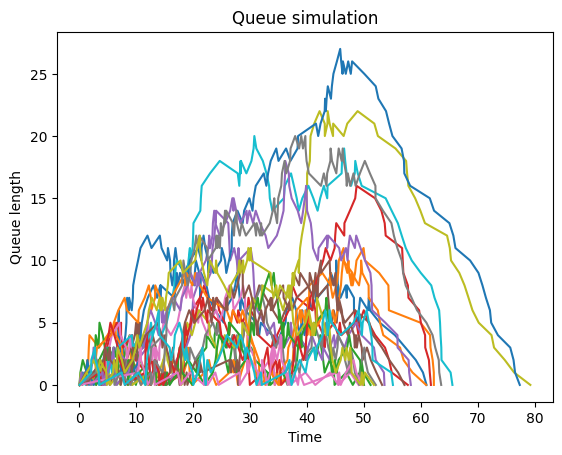

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Run first the following command:
# jupyter nbconvert --to script lab2/discrete_events_simulation.ipynb


# add lab 2 to the path
import sys
import os
lab2_path = os.path.abspath("../lab2")
sys.path.append(lab2_path)

#Import your solution from the previous lab.
from discrete_events_simulation import Scenario, simulate 

# Statistical analysis
## Moving mean and variance

In [ ]:
def moving_mean_var(
    new_data: float,
    old_mean: float,
    old_var: float,
    t: int
):
    """ Calculates moving sameple mean and variance at time t.
    
    Keywords:
        new_data (float): new data point arriving at time t.
        old_mean (float): previous sample mean.
        old_var (float): previous sample variance.
        t (int): time index
    
    Returns:
        new_mean (float): updated sample mean.
        new_var (float): updated sample variance.
    """
    ###
    #ADD YOUR CODE HERE.
    ###
    new_mean = old_mean + (new_data - old_mean) / (t+1)
    if t == 0:
        new_var = (new_mean - old_mean)**2
    else:
        new_var = old_var * (1 - 1/t) + (new_mean - old_mean)**2 * (t+1)
    return new_mean, new_var

## Queue simulation

In [30]:
###
#ADD YOUR CODE HERE.
###
D = 1000

max_queues = []
max_queue_mean = [0]
max_queue_var = [0]
for d in range(D):
    times, queues = simulate(Scenario())

    max_queue_mean_, max_queue_var_ = moving_mean_var(
        new_data=np.max(queues),
        old_mean=max_queue_mean[-1],
        old_var=max_queue_var[-1],
        t=d
    )
    max_queues.append(np.max(queues))
    max_queue_mean.append(max_queue_mean_)
    max_queue_var.append(max_queue_var_)


print(f"Mean of the maximum queue length: {max_queue_mean[-1]}")
print(f"Variance of the maximum queue length: {max_queue_var[-1]}")

Start of generation
Generation
Generation
Arrival
Arrival
Departure
Departure
Generation
Arrival
Generation
Departure
Generation
Arrival
Arrival
Generation
Arrival
Departure
Departure
Generation
Generation
Arrival
Arrival
Departure
Departure
Departure
Generation
Arrival
Generation
Generation
Arrival
Arrival
Departure
Departure
Generation
Departure
Arrival
Generation
Departure
Arrival
Generation
Arrival
Departure
Departure
Generation
Generation
Generation
Arrival
Generation
Arrival
Arrival
Arrival
Departure
Generation
Generation
Departure
Generation
Arrival
Departure
Generation
Generation
Departure
Arrival
Arrival
Arrival
Arrival
Departure
Departure
Departure
Generation
Generation
Arrival
Departure
Arrival
Generation
Departure
Generation
Arrival
Arrival
Generation
Generation
Arrival
Departure
Generation
Arrival
Arrival
Departure
Departure
Departure
Generation
Departure
Generation
Arrival
Departure
Arrival
Generation
Arrival
Departure
Generation
Generation
Arrival
Generation
Arrival
Gene

Plot the mean maximum queue length and standard deviation

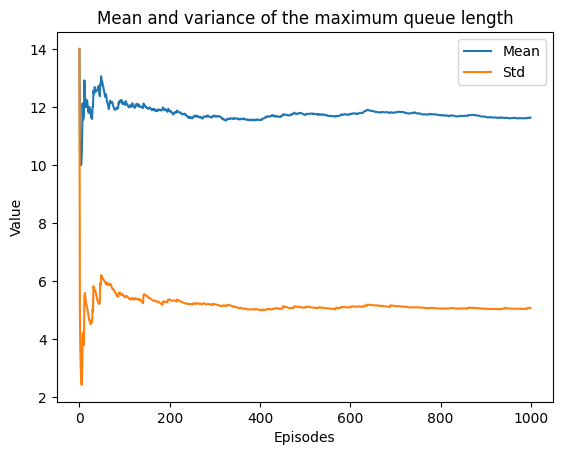

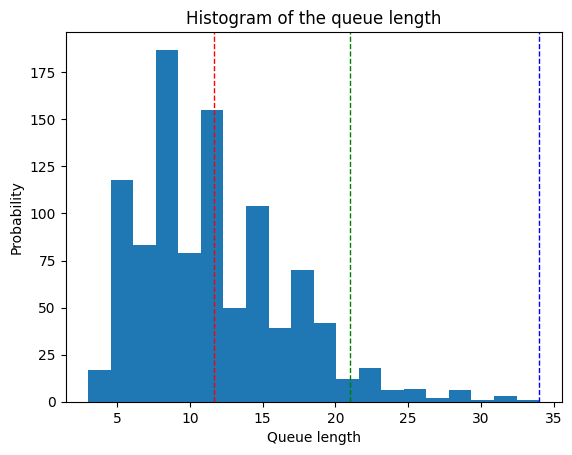

In [31]:
###
#ADD YOUR CODE HERE.
###


plt.plot(max_queue_mean[1:], label='Mean')
plt.plot(np.sqrt(max_queue_var[1:]), label='Std')
plt.xlabel('Episodes')
plt.ylabel('Value')
plt.title('Mean and variance of the maximum queue length')
plt.legend()
plt.show()


# plot histogram with mean, 95% percentile and worst case as vertical lines
plt.hist(max_queues, bins=20, density=False)
plt.axvline(np.mean(max_queues), color='r', linestyle='dashed', linewidth=1)
plt.axvline(np.percentile(max_queues, 95), color='g', linestyle='dashed', linewidth=1)
plt.axvline(np.max(max_queues), color='b', linestyle='dashed', linewidth=1)
plt.xlabel('Queue length')
plt.ylabel('Probability')
plt.title('Histogram of the queue length')
plt.show()

## Bootstrapping

In [34]:
def bootstrap(
    data: np.array,
    f_statistic,
    draws: int = 100,
):
    """ Calculates the bootstrap mse of a statistic of choice
    
    Keywords:
        data (array): data array.
        f_statistic: function handle calculating the statistic of interest.
        draws (int): number of bootstrap draws.
    
    Returns:
        mse (float): mean square error of the statistic of interest.
    """
    ###
    #ADD YOUR CODE HERE.
    ###
    mses = []
    for _ in range(draws):
        r = np.random.uniform(0, 1, size=(len(data)))
        r = np.floor(r * len(data)).astype(int)
        bootstrapped_data = data[r]
        bootstrapped_statistic = f_statistic(bootstrapped_data)
        mse = np.mean((bootstrapped_statistic - f_statistic(data))**2)
        mses.append(mse)
    return np.mean(mses)
    

In [36]:
D = 2750

max_queues = []
for d in range(D):
    times, queues = simulate(Scenario())

    max_queues.append(np.max(queues))


mse_mean = bootstrap(
    data=np.array(max_queues),
    f_statistic=np.mean,
    draws=100
)

mse_95_percentile = bootstrap(
    data=np.array(max_queues),
    f_statistic=lambda x: np.percentile(x, 95),
    draws=100
)

mse_worst_case = bootstrap(
    data=np.array(max_queues),
    f_statistic=np.max,
    draws=100
)

print(f"MSE of the mean: {mse_mean}")
print(f"MSE of the 95% percentile: {mse_95_percentile}")
print(f"MSE of the worst case: {mse_worst_case}")

Start of generation
Generation
Arrival
Departure
Generation
Arrival
Departure
Generation
Arrival
Departure
Generation
Arrival
Departure
Generation
Generation
Generation
Generation
Arrival
Arrival
Arrival
Arrival
Generation
Arrival
Departure
Departure
Departure
Generation
Departure
Generation
Arrival
Departure
Departure
Generation
Arrival
Generation
Generation
Arrival
Arrival
Arrival
Generation
Departure
Departure
Departure
Arrival
Generation
Generation
Arrival
Arrival
Departure
Generation
Arrival
Generation
Departure
Departure
Generation
Arrival
Generation
Arrival
Arrival
Generation
Generation
Arrival
Arrival
Generation
Generation
Arrival
Departure
Arrival
Generation
Departure
Arrival
Generation
Arrival
Departure
Generation
Generation
Arrival
Arrival
Departure
Generation
Generation
Arrival
Generation
Arrival
Generation
Arrival
Arrival
Generation
Departure
Arrival
Generation
Generation
Generation
Arrival
Arrival
Generation
Arrival
Arrival
Departure
Departure
Generation
Generation
Depart